#Colab 搭配 OpenVINO Pretrained Model 影像實例分割範例

使用OpenVINO加上Intel's預訓練模型進行影像實例分割，可適用於智慧教室應用。  
參考資料來源：https://docs.openvino.ai/latest/omz_demos_instance_segmentation_demo_python.html      
歐尼克斯實境互動工作室 OmniXRI Jack, 2022.05.03 整理製作

# 1. 安裝Intel OpenVINO工具包
以apt方式安裝OpenVINO，安裝版本為 2021.4.752  
預設安裝路徑為/opt/intel/OpenVINO_2021.4.752，系統會自建出/opt/intel/OpenVINO_2021捷徑名稱，後續可使用這個較短捷徑名稱。  
若想安裝其它版本，可透過下列指令進行查詢。  
!apt-cache search intel-openvino

In [1]:
# 顯示目前工作目錄
!pwd
# 取得OpenVINO 2021公開金錀
!wget https://apt.repos.intel.com/openvino/2021/GPG-PUB-KEY-INTEL-OPENVINO-2021 
# 加入OpenVINO公開金錀到系統金錀群中
!apt-key add GPG-PUB-KEY-INTEL-OPENVINO-2021 
# 建立更新安裝清單檔案
!touch /etc/apt/sources.list.d/intel-openvino-2021.list
# 將下載指令加入安裝清單中
!echo "deb https://apt.repos.intel.com/openvino/2021 all main" >> /etc/apt/sources.list.d/intel-openvino-2021.list
# 更新系統
!apt update
# 安裝OpenVINO到虛擬機系統中
!apt install intel-openvino-dev-ubuntu18-2021.4.752 
# 列出安裝路徑下內容進行確認
!ls /opt/intel

/content
--2022-05-03 13:59:06--  https://apt.repos.intel.com/openvino/2021/GPG-PUB-KEY-INTEL-OPENVINO-2021
Resolving apt.repos.intel.com (apt.repos.intel.com)... 104.80.127.180, 2600:1406:3c:397::4b23, 2600:1406:3c:38f::4b23
Connecting to apt.repos.intel.com (apt.repos.intel.com)|104.80.127.180|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 939 [binary/octet-stream]
Saving to: ‘GPG-PUB-KEY-INTEL-OPENVINO-2021’

GPG-PUB-KEY-INTEL-O 100%[===================>]     939  --.-KB/s    in 0s      

2022-05-03 13:59:07 (118 MB/s) - ‘GPG-PUB-KEY-INTEL-OPENVINO-2021’ saved [939/939]

OK
Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://apt.repos.intel.com/openvino/2021 all InRelease [5,659 B]
Hit:5 https://developer.download.nv

# 2. 下載影像實例分割模型
可選用下列Intel's 預訓練模型，更多可選用模型可參考 https://docs.openvino.ai/latest/omz_demos_instance_segmentation_demo_python.html  

*   instance-segmentation-person-0007
*   instance-segmentation-security-xxxx (0002/0091/0228/1039/1040)  
*   yolact-resnet50-fpn-pytorch

這裡選用 --name instance-segmentation-security-0228 （可自行變更所需模型名稱）  
**注意！執行OpenVINO功能前記得設定環境變數（setupvars.sh），否則會得到錯誤訊息。**  

In [2]:
# 執行環境設定批次檔並以模型下載器取得模型
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/downloader.py	 \
       --name instance-segmentation-security-0228

[setupvars.sh] OpenVINO environment initialized
################|| Downloading instance-segmentation-security-0228 ||################

========== Downloading /content/intel/instance-segmentation-security-0228/FP32/instance-segmentation-security-0228.xml
... 100%, 962 KB, 1482 KB/s, 0 seconds passed

========== Downloading /content/intel/instance-segmentation-security-0228/FP32/instance-segmentation-security-0228.bin
... 100%, 187601 KB, 32356 KB/s, 5 seconds passed

========== Downloading /content/intel/instance-segmentation-security-0228/FP16/instance-segmentation-security-0228.xml
... 100%, 961 KB, 1466 KB/s, 0 seconds passed

========== Downloading /content/intel/instance-segmentation-security-0228/FP16/instance-segmentation-security-0228.bin
... 100%, 93801 KB, 35638 KB/s, 2 seconds passed

========== Downloading /content/intel/instance-segmentation-security-0228/FP16-INT8/instance-segmentation-security-0228.xml
... 100%, 1531 KB, 1944 KB/s, 0 seconds passed

========== Downloading

# 3. 模型優化
如果下載的是Intel's Pretrained Model則不需轉換及優化就自帶IR檔(xml,bin)  
若是Public Pretrained Model則須進行轉換成IR檔，系統會自動判別。  
--name 參數為待轉換模型名稱  

In [3]:
# 下載及安裝test-generator 方便檢查程式運行錯誤
!pip install test-generator==0.1.1

# 執行環境設定批次檔並將下載到的模型檔進行優化轉換產生IR(xml & bin)檔
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python /opt/intel/openvino_2021/deployment_tools/tools/model_downloader/converter.py	 \
       --name instance-segmentation-security-0228

[setupvars.sh] OpenVINO environment initialized
========== Skipping instance-segmentation-security-0228 (no conversions defined)



檢查模型轉檔後會產生/FP16, FP16-INT8, FP32不同精度的IR檔(xml, bin)

In [4]:
!ls /content/intel/instance-segmentation-security-0228
!ls /content/intel/instance-segmentation-security-0228/FP32

FP16  FP16-INT8  FP32
instance-segmentation-security-0228.bin
instance-segmentation-security-0228.xml


為更清楚了解人臉、身份辨識範例程式可支援的模型，可將models.lst及使用方式列出來確認。（此步驟可忽略）

In [5]:
# 列出範例程式所在目錄內容
!ls /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/instance_segmentation_demo/python/
# 列出可支援的模型名稱及對應的結構類型(architecture_type)
!cat /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/instance_segmentation_demo/python/models.lst
# 列出身份辨識程式的參數說明文件
!cat /opt/intel/openvino_2021/deployment_tools/inference_engine/demos/instance_segmentation_demo/python/README.md

instance_segmentation_demo     instance_segmentation.gif  README.md
instance_segmentation_demo.py  models.lst
# This file can be used with the --list option of the model downloader.
instance-segmentation-security-????
yolact-resnet50-fpn-pytorch
# Instance Segmentation Python\* Demo

![example](./instance_segmentation.gif)

This demo shows how to perform instance segmentation using OpenVINO.

> **NOTE**: Only batch size of 1 is supported.

## How It Works

The demo application expects an instance segmentation model in the Intermediate Representation (IR) format with the following constraints:
1. for instance segmentation models based on `Mask RCNN` approach:
    * Two inputs: `im_data` for input image and `im_info` for meta-information about the image (actual height, width and scale).
    * At least four outputs including:
        * `boxes` with absolute bounding box coordinates of the input image
        * `scores` with confidence scores for all bounding boxes
        * `classes` with

# 4. 準備測試用影像及影片

## 4.1 下載測試影像

從網路獲取任意一張測試影像並另存成input.jpg並顯示。  
若要從Github中取得影像時，需將原檔案路徑修改為原始檔型式。  
首先在Github原始影像上以滑鼠右鍵點擊，選擇「複製圖片鏈結」取得影像原始網址，例： https://github.com/OmniXRI/NTUST_EdgeAI_2022/blob/main/Ch7_Implementations/Dataset/classroom_01.jpg  
接著修改後檔名：主要是將github.com變成raw.githubusercontent.com，把/blob/main改成master路徑名稱，其它子路徑保留  
https://raw.githubusercontent.com/OmniXRI/NTUST_EdgeAI_2022/master/Ch7_Implementations/Dataset/classroom_01.jpg  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # This is added back by InteractiveShellApp.init_path()


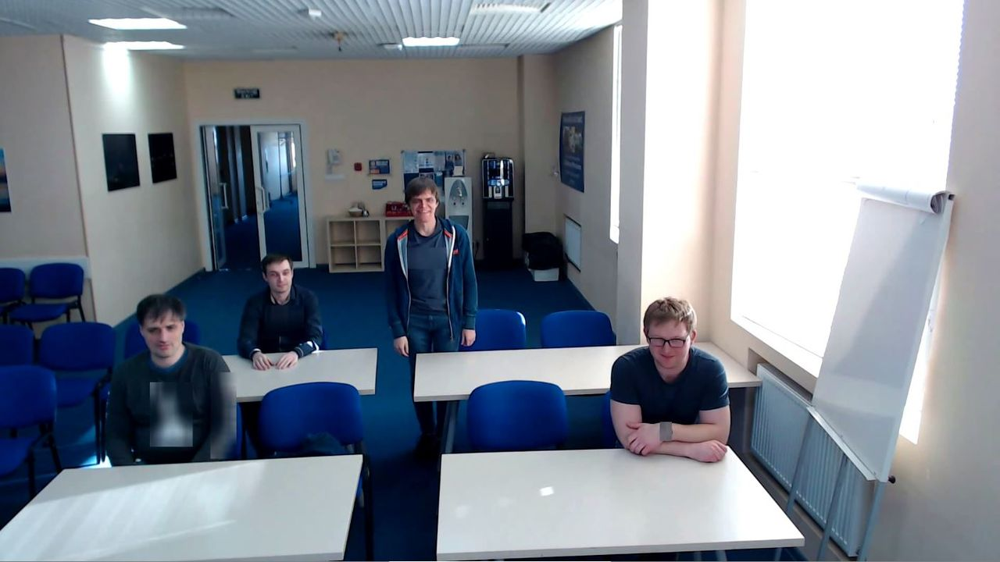

In [6]:
# 以OpenCV檢視輸入影像
import cv2 # 導入OpenCV套件包
from google.colab.patches import cv2_imshow # 導入顯示OpenCV格式影像套件包
import numpy as np # 導入numpy套件包
import requests # 導入requests套件包

# 從網路獲取一張影像
file = requests.get("https://raw.githubusercontent.com/OmniXRI/NTUST_EdgeAI_2022/master/Ch7_Implementations/Dataset/classroom_01.jpg")

# 將影像轉成OpenCV格式
img = cv2.imdecode(np.fromstring(file.content, np.uint8), 1)
cv2.imwrite('input.jpg',img)
cv2_imshow(img) # 顯示輸入影像

## 4.2 下載測試影片

由於Colab只支援H.264編碼格式的mp4影片顯示，所以要先ffmpeg進行格式轉換，再顯示。

In [7]:
# 取得測試影片
!wget https://raw.githubusercontent.com/OmniXRI/NTUST_EdgeAI_2022/master/Ch7_Implementations/Dataset/classroom.mp4

--2022-05-03 14:00:18--  https://raw.githubusercontent.com/OmniXRI/NTUST_EdgeAI_2022/master/Ch7_Implementations/Dataset/classroom.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13548133 (13M) [application/octet-stream]
Saving to: ‘classroom.mp4’

classroom.mp4       100%[===================>]  12.92M  --.-KB/s    in 0.08s   

2022-05-03 14:00:19 (168 MB/s) - ‘classroom.mp4’ saved [13548133/13548133]



顯示下載到的影片內容（可略過）

由於Colab只能顯示H.264編碼格式的mp4影片檔案，所以要先以ffmpeg轉檔，再進行顯示。

In [8]:
# 以ffmpeg將mp4檔案轉成H.264編碼格式的mp4檔案
!ffmpeg -i /content/classroom.mp4 -vcodec libx264 /content/input_x264.mp4

from IPython.display import HTML
from base64 import b64encode

vs_out = open('/content/input_x264.mp4','rb').read() # 開啟並讀取mp4格式視頻檔
data_url = "data:video/mp4;base64," + b64encode(vs_out).decode() # 設定顯示內容格式
HTML(f'<video width=600 controls><source src={data_url} type="video/mp4"></video>') # 將視頻顯示於視窗上

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

#5. 進行推論
執行環境設定批次檔並執行推論  

輸入參數：  
-d 執行裝置，預設為CPU (Colab提供的Intel Xeon CPU),Colab不支援Intel的GPU,MYRIAD(VPU),FPGA   
-i 輸入影像/影片/攝影機名稱 (\*.png, \*.jpg, \*.mp4, cam-id ...)  
-m 實例分割模型名稱 (\*.xml)  
--label 分類標籤名稱  
--no_show 執行過程中不顯示，在Colab上一定要使用，不然會報錯  
-o 輸出影像/影片名稱 (\*.png, \*.jpg, \*.mp4)  

其它更多參數用法可參考：  
https://docs.openvino.ai/latest/omz_demos_instance_segmentation_demo_python.html

## 5.1 單張影像實例分割

輸入影像名稱：input.jpg  
輸出影像名稱：output.jpg  
以Colab cv2_imshow()顯示結果影像  

[setupvars.sh] OpenVINO environment initialized
/usr/local/lib/python3.7/dist-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/usr/local/lib/python3.7/dist-packages/scipy/sparse/sputils.py:17: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  supported_dtypes = [np.typeDict[x] for x in supported_dtypes]
/usr/local/lib/python3.7/dist-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy

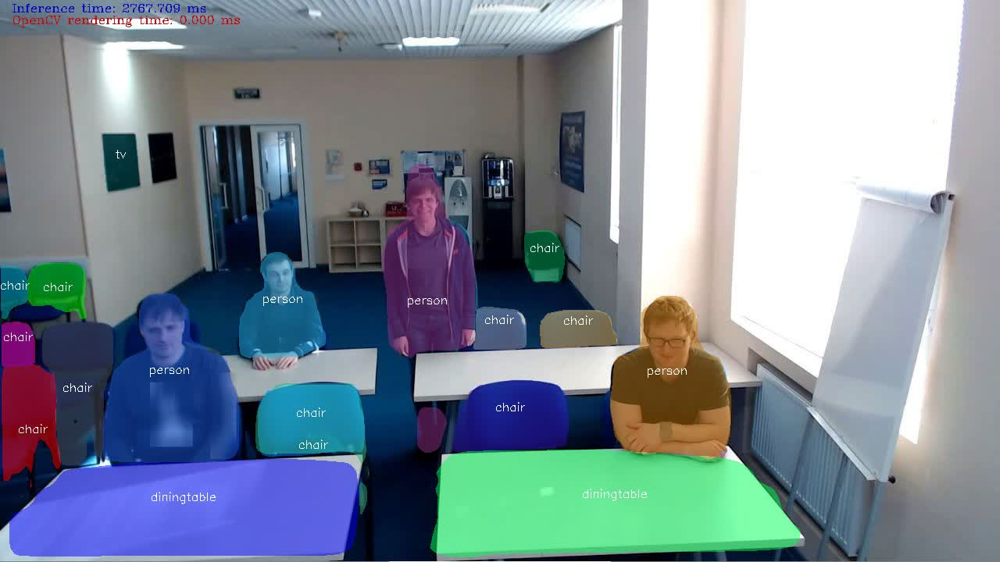

In [9]:
# 執行環境設定批次檔並執行推論(單張影像輸入)
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python \
/opt/intel/openvino_2021/deployment_tools/inference_engine/demos/instance_segmentation_demo/python/instance_segmentation_demo.py \
  -i /content/input.jpg \
  -m /content/intel/instance-segmentation-security-0228/FP32/instance-segmentation-security-0228.xml \
  --label /opt/intel/openvino_2021/deployment_tools/open_model_zoo/data/dataset_classes/coco_80cl_bkgr.txt \
  --no_show \
  -o output.jpg

out_img = cv2.imread("output.jpg") # 讀入結果影像
cv2_imshow(out_img) # 顯示結果影像 

## 5.2 以影片進行身份辨識

輸入影像名稱：classroom.mp4  
輸出影像名稱：output.avi  
由於Colab只能顯示H.264編碼格式的mp4影片檔案，所以要先以ffmpeg轉檔，再進行顯示。  

In [10]:
# 執行環境設定批次檔並執行推論(單張影像輸入)
!source /opt/intel/openvino_2021/bin/setupvars.sh && \
python \
/opt/intel/openvino_2021/deployment_tools/inference_engine/demos/instance_segmentation_demo/python/instance_segmentation_demo.py \
  -i /content/classroom.mp4 \
  -m /content/intel/instance-segmentation-security-0228/FP32/instance-segmentation-security-0228.xml \
  --label /opt/intel/openvino_2021/deployment_tools/open_model_zoo/data/dataset_classes/coco_80cl_bkgr.txt \
  --no_show \
  -o output.avi

[setupvars.sh] OpenVINO environment initialized
/usr/local/lib/python3.7/dist-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/usr/local/lib/python3.7/dist-packages/scipy/sparse/sputils.py:17: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  supported_dtypes = [np.typeDict[x] for x in supported_dtypes]
/usr/local/lib/python3.7/dist-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy

In [ ]:
# 以ffmpeg將avi檔案轉成H.264格式的mp4檔案
!ffmpeg -i /content/output.avi -vcodec libx264 /content/output_x264.mp4

from IPython.display import HTML
from base64 import b64encode

vs_out = open('/content/output_x264.mp4','rb').read() # 開啟並讀取mp4格式視頻檔
data_url = "data:video/mp4;base64," + b64encode(vs_out).decode() # 設定顯示內容格式
HTML(f'<video width=600 controls><source src={data_url} type="video/mp4"></video>') # 將視頻顯示於視窗上